In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import scanpy as sc

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.1.24 (python 3.7.3) on 2019-10-28 18:44.


In [2]:
scv.settings.set_figure_params('scvelo', dpi_save=200, dpi=80, transparent=True)
scv.settings.plot_prefix = 'scvelo_fig3_'
scv.settings.verbosity = 2

In [3]:
adata = scv.datasets.pancreatic_endocrinogenesis()

## Velocity Analysis of pancreatic endocrinogenesis - day 15

In [4]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_neighbors=30, n_pcs=30)

Filtered out 20801 genes that are detected in less than 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:04)
computing moments based on connectivities
    finished (0:00:00)


In [5]:
scv.tl.velocity(adata, vkey='steady_state_velocity', mode='steady_state')
scv.tl.velocity_graph(adata, vkey='steady_state_velocity')

scv.tl.velocity(adata, vkey='stochastic_velocity', mode='stochastic')
scv.tl.velocity_graph(adata, vkey='stochastic_velocity')

computing velocities
    finished (0:00:00)
computing velocity graph
    finished (0:00:07)
computing velocities
    finished (0:00:01)
computing velocity graph
    finished (0:00:11)


In [6]:
scv.tl.recover_dynamics(adata)

recovering dynamics
    finished (0:13:41)


In [7]:
# adata.write('data/pancreas/endoDM.h5ad', compression='gzip')
# adata = scv.read('data/pancreas/endoDM.h5ad', cache=True)

In [8]:
scv.tl.velocity(adata, vkey='dynamical_velocity', mode='dynamical')
scv.tl.velocity_graph(adata, vkey='dynamical_velocity')

computing velocities
    finished (0:00:05)
computing velocity graph
    finished (0:00:07)


computing velocity embedding
    finished (0:00:00)


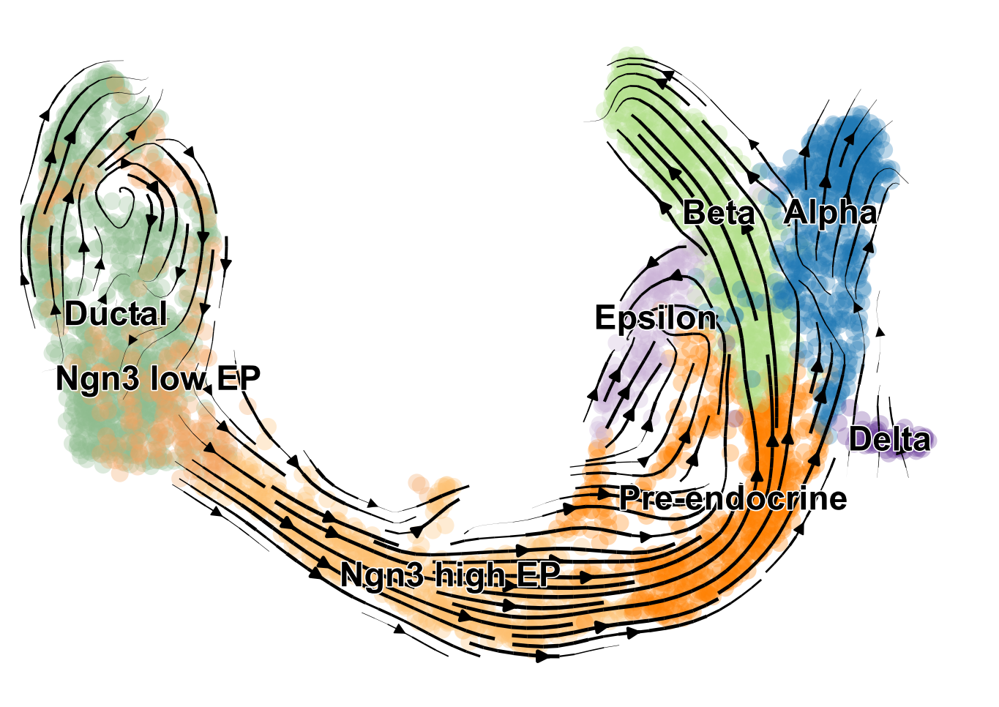

In [9]:
scv.pl.velocity_embedding_stream(adata, vkey='dynamical_velocity', title='', legend_fontsize=14, dpi=120)

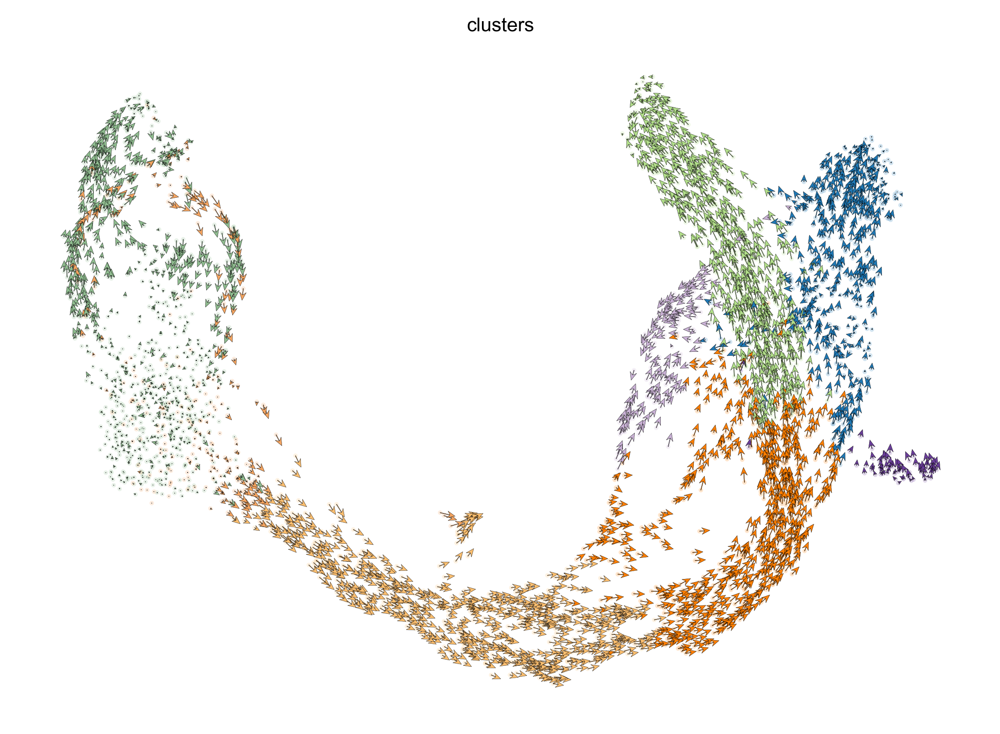

In [10]:
scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', arrow_length=3, arrow_size=1.4, dpi=200)

saving figure to file ./figures/scvelo_fig3_3.pdf


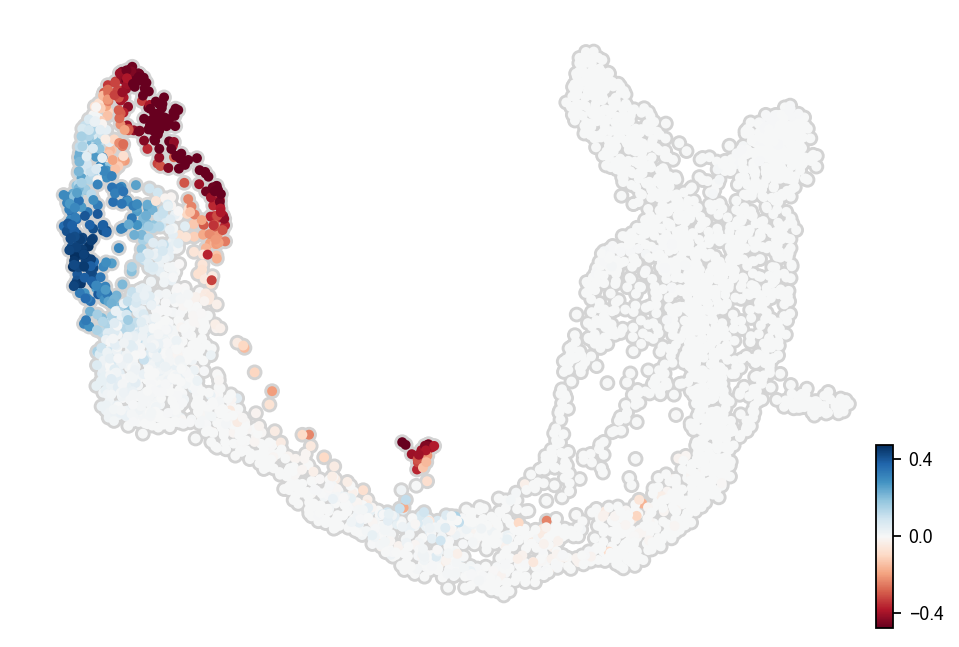

In [11]:
col = (adata.obs['S_score'] - adata.obs['G2M_score']) * (adata.obs['S_score'] + adata.obs['G2M_score'] > 1e-2)
col /= np.max(np.abs(col))

ax = scv.pl.scatter(adata, color='lightgrey', show=False, alpha=1, size=200)
scv.pl.scatter(adata, color=col, color_map='RdBu', vmid=0, alpha=1, smooth=True, size=80, save='3', ax=ax, zorder=3)

computing terminal states
    identified 1 region of root cells and 1 region of end points 
    finished (0:00:00)
computing latent time
    finished (0:00:02)
saving figure to file ./figures/scvelo_fig3_7.pdf


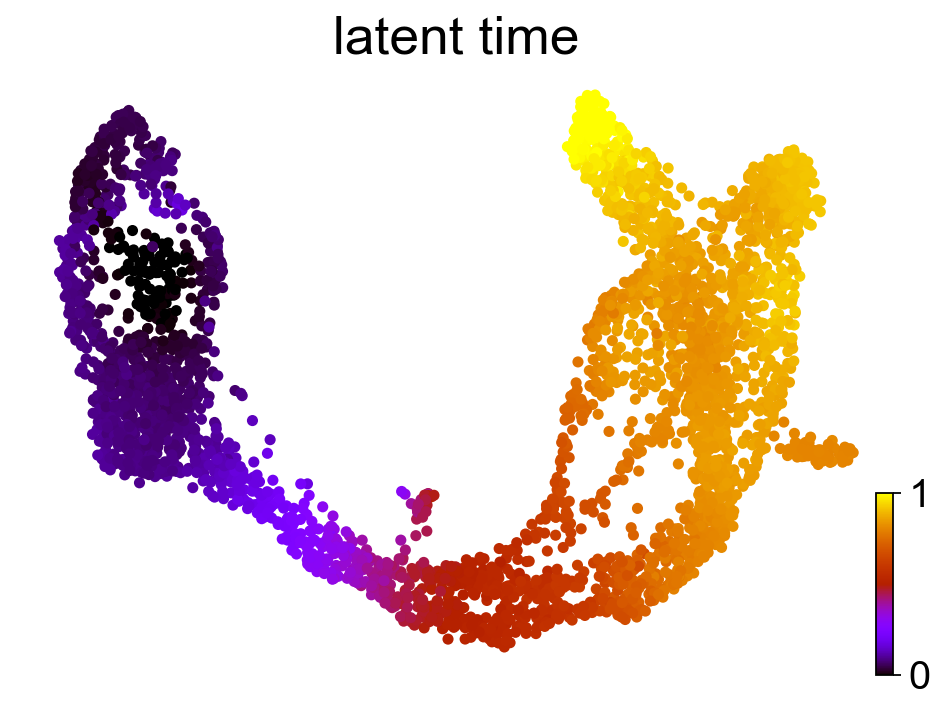

In [12]:
scv.tl.recover_latent_time(adata, vkey='dynamical_velocity')

scv.pl.scatter(adata, color='latent_time', fontsize=24, size=100,
               color_map='gnuplot', perc=[2, 98], colorbar=True, rescale_color=[0,1], save='7')

saving figure to file ./figures/scvelo_fig3_6.pdf


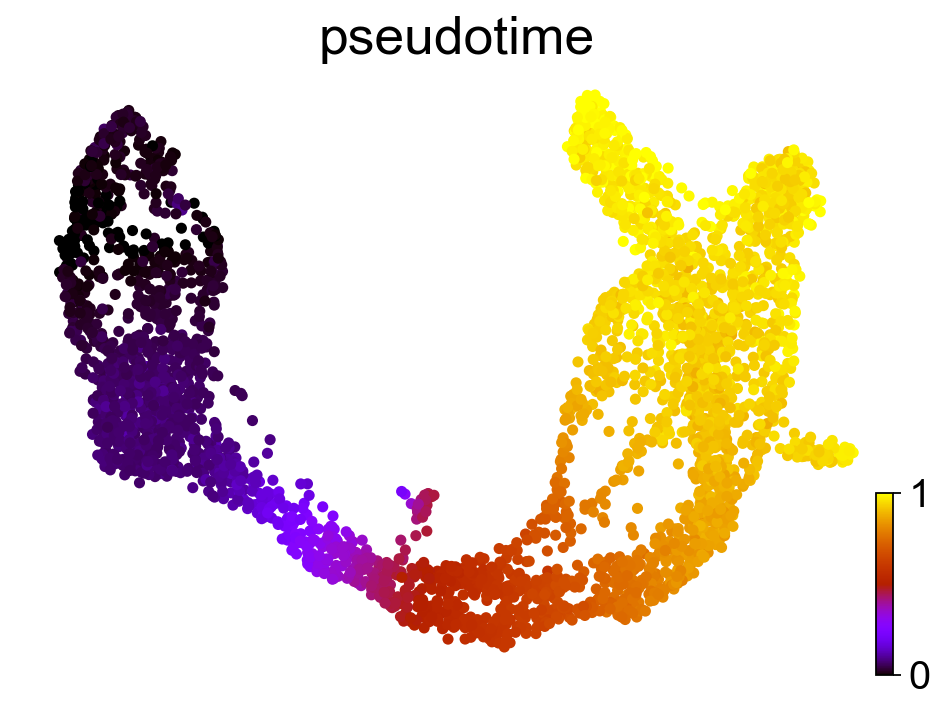

In [13]:
adata.uns['iroot'] = adata.obsm['X_umap'][:, 0].argmin()
scv.tl.diffmap(adata)
scv.tl.dpt(adata)

scv.pl.scatter(adata, color='dpt_pseudotime', title='pseudotime', fontsize=24, size=100,
               color_map='gnuplot', perc=[2, 98], colorbar=True, rescale_color=[0,1], save='6')

saving figure to file ./figures/scvelo_fig3_heatmap_8.png


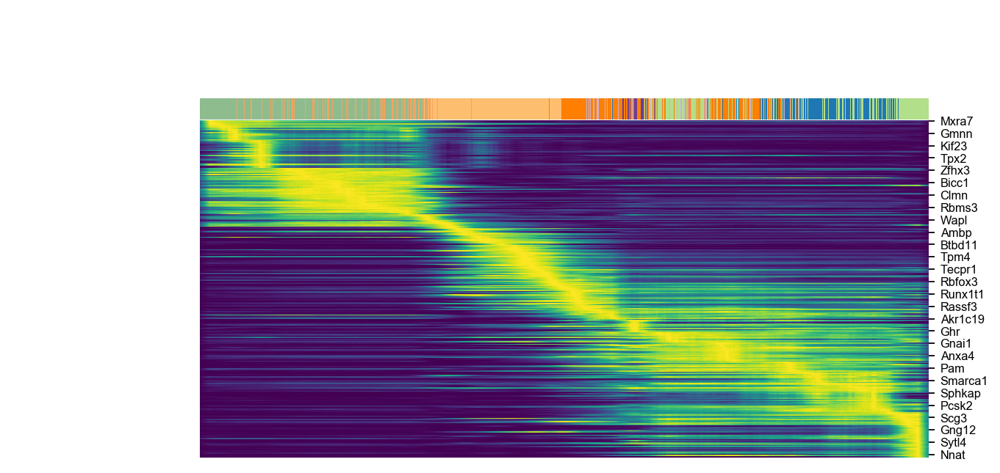

In [25]:
var_names = adata.var_names[adata.var.fit_likelihood.argsort()[::-1]][:300]
scv.pl.heatmap(adata, var_names=var_names, tkey='latent_time', n_convolve=100, col_color='clusters', save='8.png')

## Estimation with Velocyto

In [18]:
vlm = scv.utils.convert_to_loom(adata)

vlm.fit_gammas(fit_offset=False)

vlm.predict_U()
vlm.calculate_velocity()
vlm.calculate_shift()
vlm.extrapolate_cell_at_t()

vlm.estimate_transition_prob(hidim='Sx_sz', emebed='ts', transform='linear')
vlm.calculate_embedding_shift(sigma_corr=.05, expression_scaling=False, )

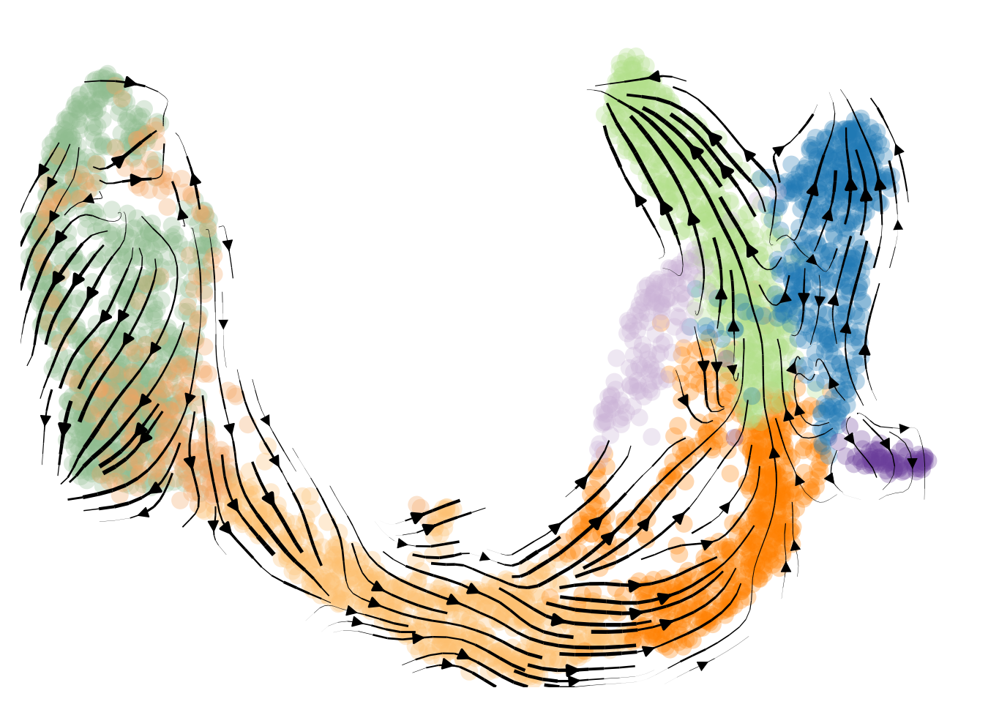

In [30]:
scv.pl.velocity_embedding_stream(adata, X=vlm.embedding, V=vlm.delta_embedding, 
                                 legend_loc='none', title='', frameon=False, dpi=120)

## Supplementary

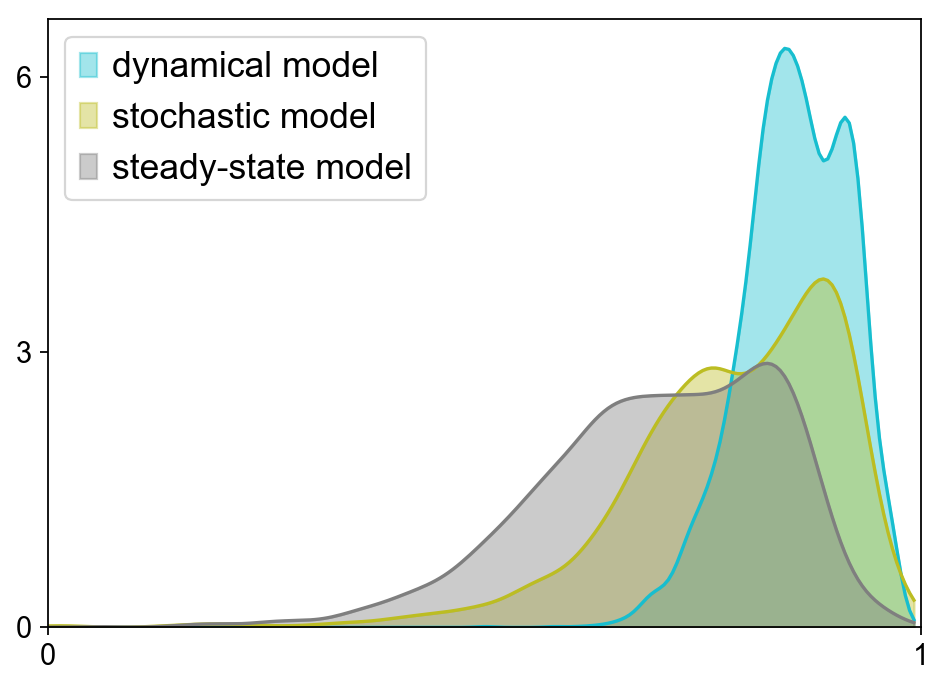

In [24]:
vkey_ss = 'steady_state_velocity'
vkey_sm = 'stochastic_velocity'
vkey_dm = 'dynamical_velocity'
scv.tl.velocity_confidence(adata, vkey=vkey_ss)
scv.tl.velocity_confidence(adata, vkey=vkey_sm)
scv.tl.velocity_confidence(adata, vkey=vkey_dm)

scv.pl.hist([adata.obs[vkey_dm + '_confidence'].values, 
             adata.obs[vkey_sm + '_confidence'].values,
             adata.obs[vkey_ss + '_confidence'].values], 
            labels=['dynamical model', 'stochastic model', 'steady-state model'], kde=True, 
            bins=200, xlim=[0, 1], fontsize=18, legend_fontsize=16)

In [150]:
top_genes = adata.var_names[adata.var.fit_likelihood.argsort()[::-1]]
rnd_genes = np.random.choice(adata.var_names, size=adata.n_vars)
full_graph = adata.uns['dynamical_velocity_graph'].A
adj = full_graph / full_graph > 0
n_genes = np.array([10, 30, 300, 500, 800, 1000])
rhos = []
rhos_med = []
for n in n_genes:
    if n == 0: 
        rhos_med.extend([0])
    else:
        idx = adata.var_names.isin(top_genes[:n])

        vgraph = scv.VelocityGraph(adata[:, idx], vkey='dynamical_velocity') 
        vgraph.compute_cosines()

        rho = scv.utils.vcorrcoef(full_graph * adj, vgraph.graph.A * adj)

        rhos.extend([rho])
        rhos_med.extend([np.nanmedian(rho)])

rhos = np.array(rhos)
rhos_med = np.array(rhos_med)

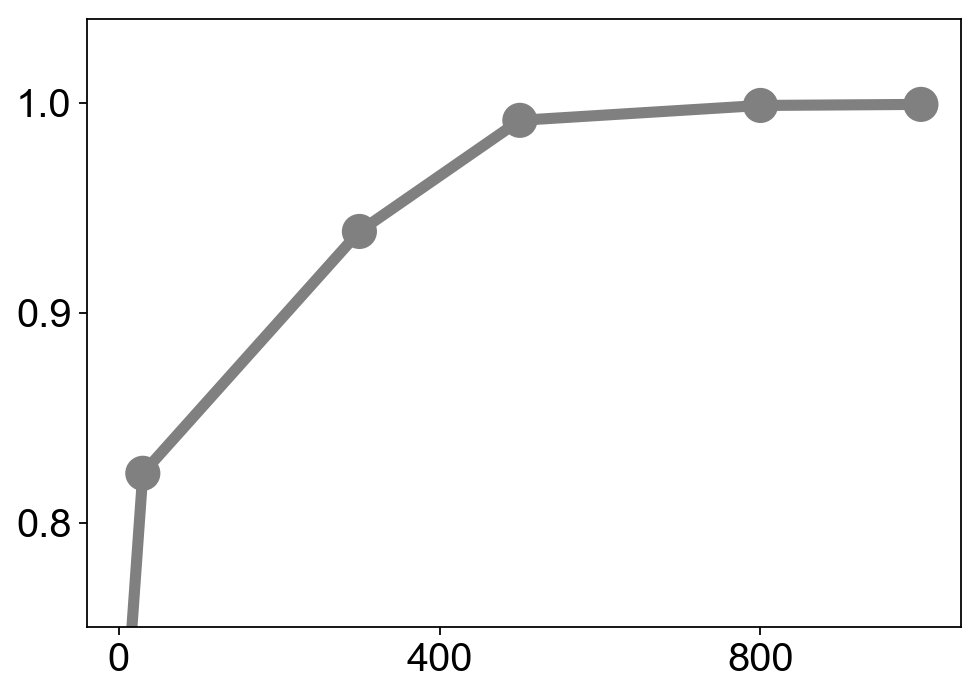

In [170]:
ax = scv.pl.scatter(x=n_genes, y=rhos_med, size=1000, show=False, ylim=[.75, 1.04], fontsize=24)
ax.plot(n_genes, rhos_med, color='grey', linewidth=5)
#ax.set_ylim([.7, 1.04])

computing velocity embedding
    finished (0:00:00)


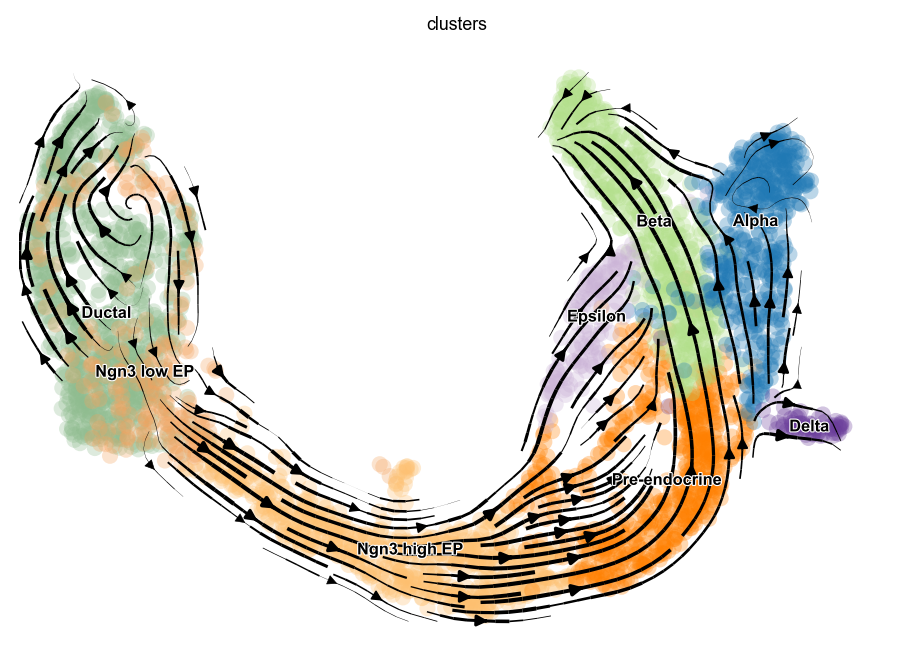

In [192]:
sdata = adata[:, adata.var_names.isin(top_genes[:30])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

computing velocity graph
    finished (0:00:06)
computing velocity embedding
    finished (0:00:00)


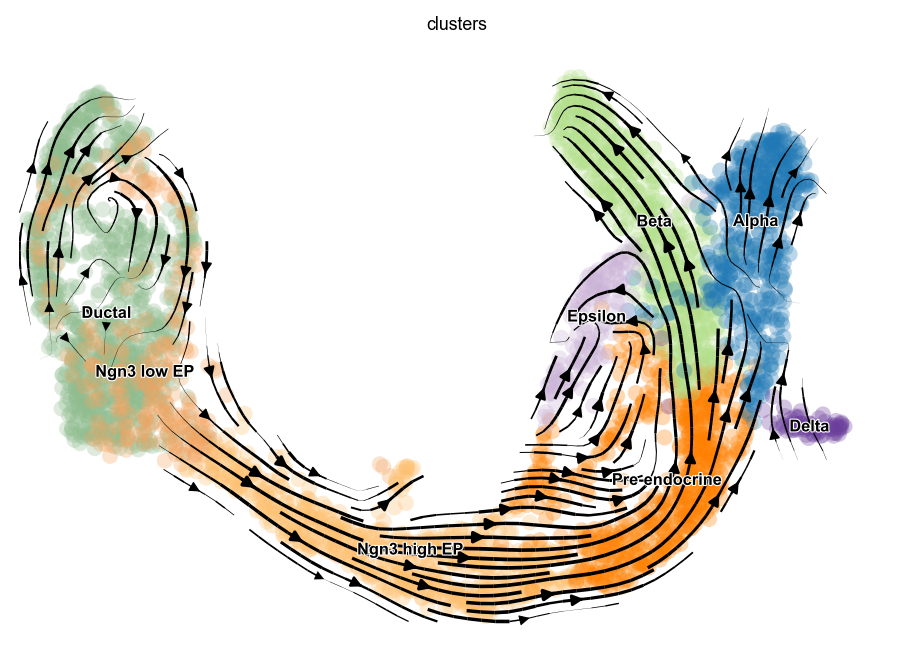

In [193]:
sdata = adata[:, ~adata.var_names.isin(top_genes[:30])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

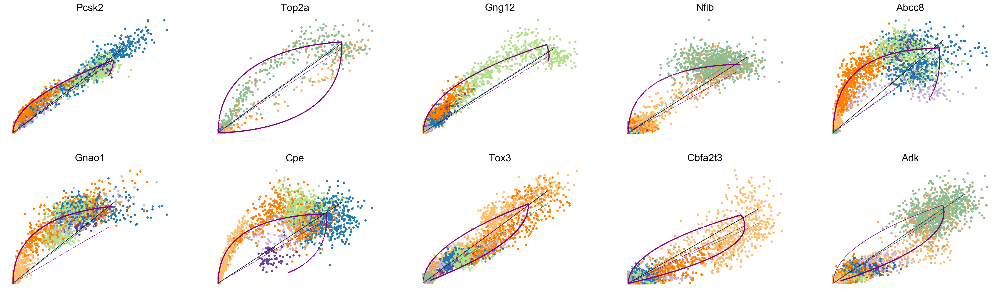

In [146]:
# ['Pcsk2', 'Top2a', 'Gng12', 'Nfib', 'Abcc8', 'Gnao1', 'Cpe', 'Tox3', 'Cbfa2t3', 'Adk']
scv.pl.scatter(adata, basis=top_genes[:10], legend_loc='none', 
               size=80, frameon=False, ncols=5, fontsize=20)

In [ ]:
adata_sub.var['fit_t_'].values

1.1440653481638527


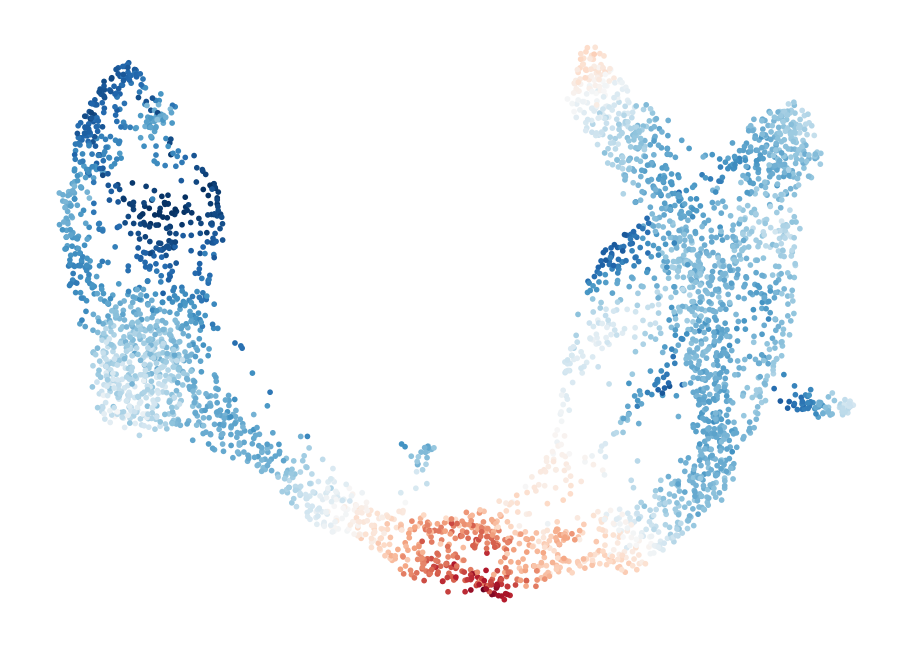

In [92]:
conn = scv.utils.get_connectivities(adata)

sdiff = adata.layers['fit_t'] - adata.var['fit_t_'].values

upreg = np.sum(sdiff < 0, axis=0) > adata.n_obs / 5
dnreg = np.sum(sdiff > 0, axis=0) > adata.n_obs / 5

idx = ~np.isnan(sdiff.sum(0))
idx &= (adata.var['fit_likelihood'] > .01) & (adata.var['velocity_genes']) & upreg & dnreg
sdiff = np.abs(sdiff[:, idx])

threshold = np.percentile(sdiff, 5)
print(threshold)
switch = np.sum(sdiff < threshold, axis=1)
switch = switch / np.max(switch)
scv.pl.scatter(adata, color=conn.dot(switch), color_map='RdBu_r', colorbar=False)

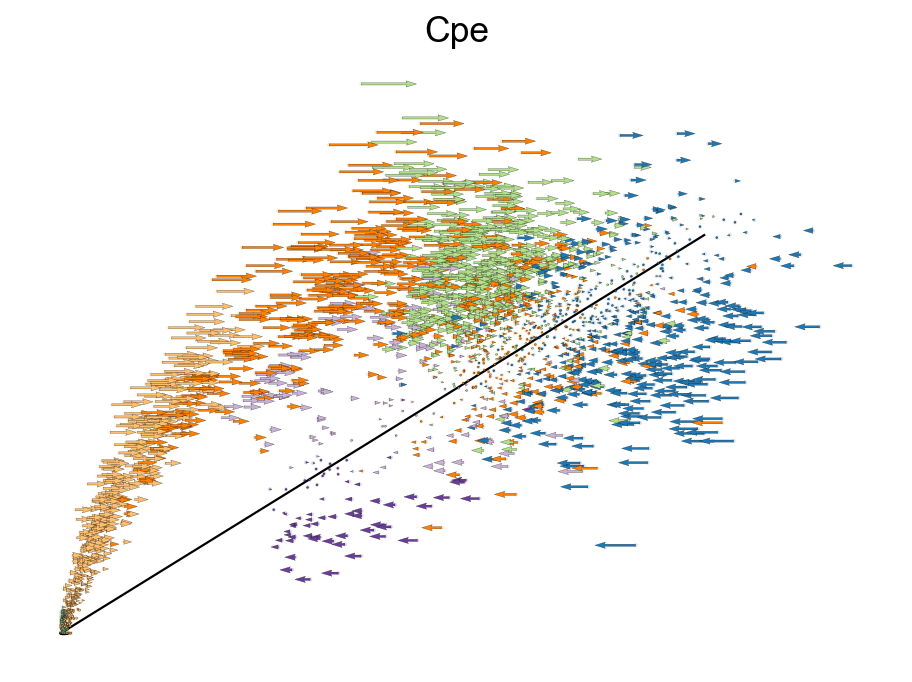

In [27]:
scv.pl.velocity_embedding(adata, vkey='steady_state_velocity', basis='Cpe', 
                          linewidth=.1, fontsize=16, frameon=False, legend_loc='none')

In [35]:
dm = scv.tl.recover_dynamics(adata, var_names='Cpe')
scv.tl.velocity(adata, vkey='dynamical_velocity', mode='dynamical')

recovering dynamics
    finished (0:00:00)

outputs model fit of gene: Cpe
computing velocities
    finished (0:00:04)


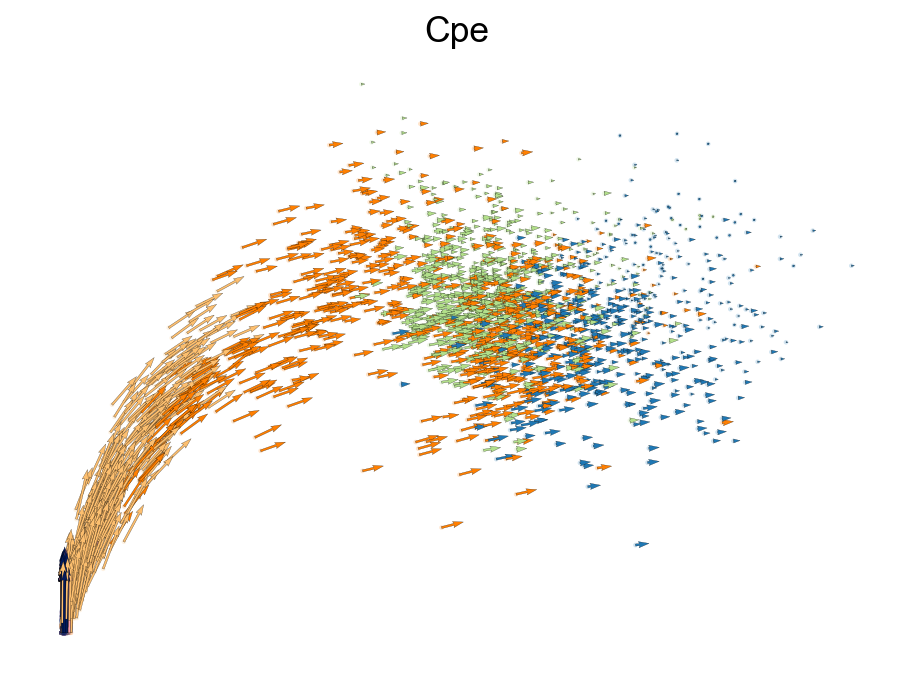

In [758]:
scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', basis='Cpe',
                          fontsize=16, frameon=False, legend_loc='none')

In [37]:
scv.tl.recover_dynamics(adata, var_names=['Actn4', 'Ppp3ca', 'Cpe', 'Nnat'], max_iter=100)

recovering dynamics
    finished (0:00:05)

outputs model fit of gene: Nnat


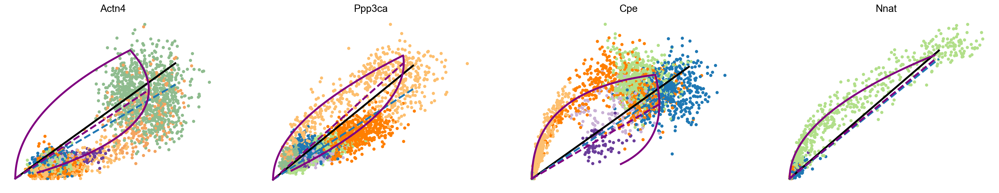

In [38]:
scv.pl.scatter(adata, basis=['Actn4', 'Ppp3ca', 'Cpe', 'Nnat'], fontsize=16, size=100, linewidth=3,
               frameon=False, legend_loc='none')

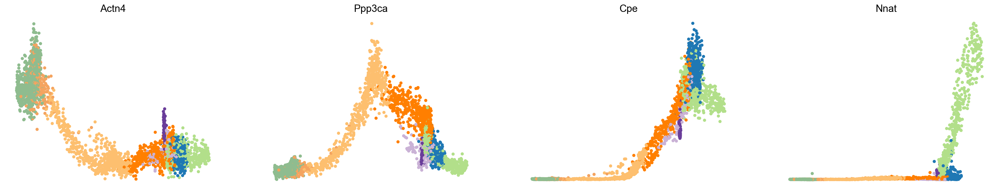

In [40]:
scv.pl.scatter(adata, x='latent_time', y=['Actn4', 'Ppp3ca', 'Cpe', 'Nnat'], fontsize=16, size=100, 
               n_convolve=None, frameon=False, legend_loc='none')

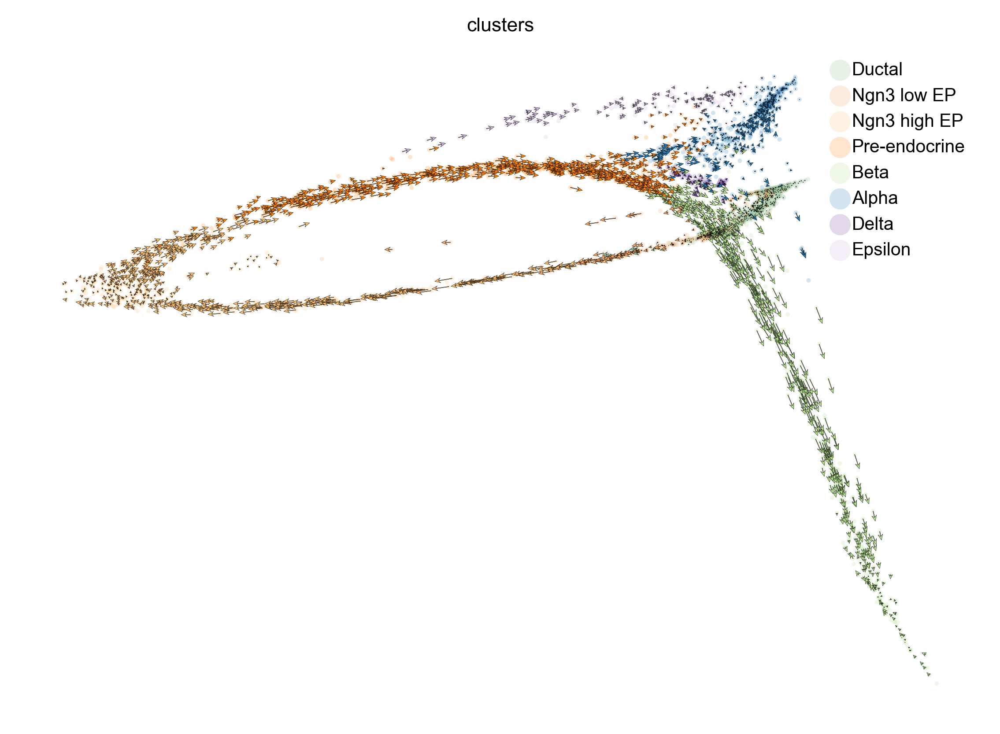

In [43]:
scv.pl.velocity_embedding(adata, basis='diffmap', vkey='dynamical_velocity', components='2,3',
                          legend_loc='best', scale=.5, density=.8, dpi=200)

recovering dynamics
    finished (0:00:01)

outputs model fit of gene: Actn4


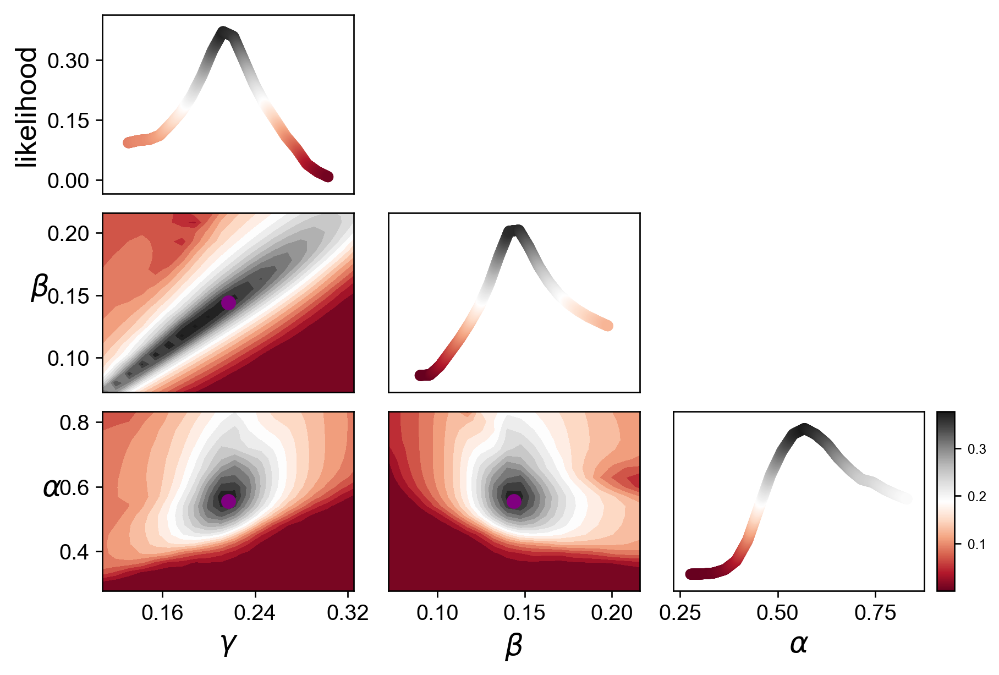

In [12]:
dm = scv.tl.recover_dynamics(adata, var_names='Actn4', t_max=20)
dm.plot_profiles(fontsize=16, dpi=120)

recovering dynamics
    finished (0:00:00)

outputs model fit of gene: Cpe


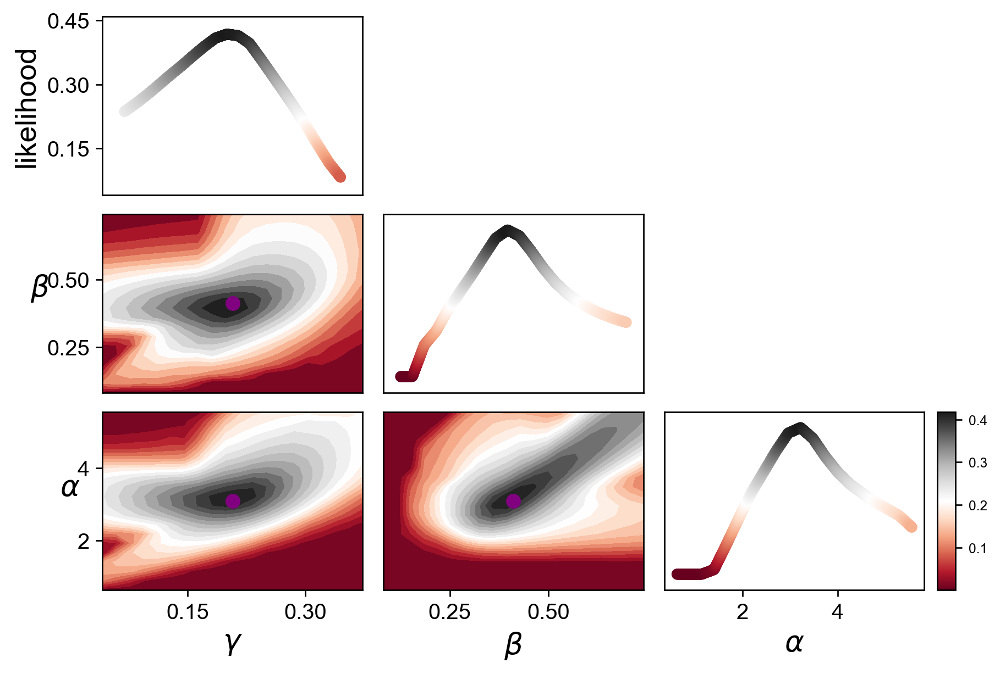

In [45]:
dm = scv.tl.recover_dynamics(adata, var_names='Cpe', t_max=20)
dm.plot_profiles(fontsize=16, dpi=120, sight=.8)